In [6]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import mdtraj as md
import os, sys
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
from importlib import reload
from cycler import cycler
# source modules and classes being developed 
import package
from package.writhe.writhe import (Writhe,
                                   to_writhe_adj_matrix,
                                   to_writhe_matrix)
from package import visualize
from package.utils import utils
from package import mdtool
from package.msmtool.msmtool import (tCCA,
                                     vamp2,
                                     MarkovModel,
                                     Kmeans,
                                     microstate_indices,
                                     cluster_similarity,
                                     sankey,
                                     pca,
                                     align_projection,
                                     closest_points,
                                     whiten,
                                     pca,
                                     CCA)

from package.mdtool.mdtool import (ResidueDistances,
                                   get_hbond_map,
                                   get_residues,
                                   calc_rsa,
                                   calc_sa,
                                   traj_slice,
                                   load_traj,
                                   rmsd_sort)

from package.utils.utils import (lsdir, group_by,
                         indices_stat, sort_by_val_in,
                         reindex_list, sort_indices_list,
                         count_int_arr, load_array_dir, filter_strs,
                         rm_path, rm_extension, count_int_arr, pmf)

from package.visualize.visualize import (subplots_fes2d,
                                         subplots_proj2d,
                                         proj2d,
                                         fes2d,
                                         get_color_list,
                                         box_plot
                                        )
from itertools import chain
from package.utils.utils import combinations

In [7]:
import ray
import multiprocessing
import functools
def distance_pair(pair=None,
                  length:np.ndarray=None,
                  xyz=None,
                  smat=None):

    if smat is None:
        assert not ((pair is None) or (xyz is None)), \
            "must input smat or both a segment and xyz coordinates"
        smat = (np.expand_dims(xyz, 0) if xyz.ndim < 3 else xyz)[:, pair]
    else:
        smat = np.expand_dims(smat, 0) if smat.ndim < 3 else smat
    
    length = np.expand_dims(length, 0) if length.ndim < 3 else length

    displacements = abs(smat[:,0,:] - smat[:,1,:])
    return np.linalg.norm((displacements / length) - (np.around(displacements / length)*length),
                          axis=-1)

def distance_pairs_along_axis(pairs: np.ndarray,
                              length: np.ndarray,
                              xyz: np.ndarray,
                              axis: int = 1):
    
    """helper function for parallelization to compute writhe over chuncks of segments for all frames in xyz"""
    return np.apply_along_axis(func1d=functools.partial(distance_pair, xyz=xyz, length=length),
                               axis=axis, arr=pairs).squeeze()
    

def calc_distance_parallel(pairs: np.ndarray,
                           length: np.ndarray,
                           xyz: np.ndarray,
                           cpus_per_job: int = 1) -> "Nframes by Nsegments np.ndarray":
    
    """parallelize writhe calculation by segment, avoids making multiple copies of coordinate (xyz) matrix using Ray shared memory"""
    #ray.init()
    xyz_ref = ray.put(xyz)  # reference to coordinates that all child processes can access without copying
    length_ref = ray.put(length)
    distance_pairs_along_axis_ref = ray.remote(distance_pairs_along_axis)
    chunks = np.array_split(pairs, int(multiprocessing.cpu_count() / cpus_per_job))
    result = np.concatenate(ray.get([distance_pairs_along_axis_ref.remote(pairs=chunk,
                                                                          xyz=xyz_ref,
                                                                          length=length_ref,
                                                                          )
                                     for chunk in chunks]), 0).T
    ray.internal.free(xyz_ref)
    ray.internal.free(length_ref)
    ray.shutdown()
    return result

In [93]:
def rsf(traj, ref):
    
    traj, ref = (traj_slice(k, f"name CA or name CO") for k in (traj, ref))
    return np.linalg.norm(traj.superpose(ref).xyz - ref.xyz, axis=-1).squeeze()

In [94]:
from package.writhe.writhe import shifted_pairs, calc_writhe_parallel, get_segments

In [128]:
def writhe_fluctuation(traj, ref, length=1): 
    """
    Memory intensive temp. version of this.
    Computationally fast if memory can handle it.
    """
    traj, ref = (traj_slice(k, "name CA") for k in (traj, ref))
    xyz = np.concatenate([traj.superpose(ref).xyz, np.concatenate([ref.xyz for i in range(traj.n_frames)])], 1)
    index0 = np.arange(xyz.shape[1] // 2)
    segments = shifted_pairs(index0, length)
    segments = np.concatenate([segments, segments + segments.max() + 1], 1)
    writhe = calc_writhe_parallel(segments, xyz)
    return writhe

def visualize_clustering(traj, frames, path, name, ref=None, features=None, ax=None):
    
    frames = frames[:10] if len(frames) >= 10 else frames
    betas = features[frames].mean(0) if features is not None else None
    make_dir(f"{path}/images")
    
    visualize.plot_structure(visualize.make_structures(traj,
                                                       indices=frames,
                                                       dir=f"{path}/images",
                                                       ensemble=True,
                                                       overwrite=True,
                                                       transparency=.6,
                                                       draw_style="arrow",
                                                       name=name,
                                                       palette = palettes['coolwarm'],
                                                       save_state=True,
                                                       cartoon_loop_radius=.25,
                                                       ref=ref,
                                                       beta_values=betas),
                         legend=False,
                         title=name,
                         ax=ax,
                         cbar=True if betas is not None else False,
                         cmap="coolwarm",
                         vmin=betas.min() if betas is not None else None,
                         vmax=betas.max() if betas is not None else None,
                         cbar_label="RMSF (nm)" if betas is not None else None,
                    )

fes2d(pca(np.concatenate([np.concatenate([writhe_fluctuation(trjs[0], refs[0], 3), writhe_fluctuation(trjs[0], refs[1], 3)], 1),
                         np.concatenate([writhe_fluctuation(trjs[1], refs[0], 3), writhe_fluctuation(trjs[1], refs[1], 3)], 1)])
          
                        )[0][:,:2],
      #title=f"{protein} RMSF PCA\n Open Reference",
      xlabel="PC1",
      ylabel="PC2",
      bins=bins,
      mask=False,
      contour_lines=True,
      n_contours=n_contours,
      alpha_contours=alpha_contours,
      alpha_lines=alpha_lines,
      #ax=ax_pca[0, 0],
      font_scale=.8,
      cmap="coolwarm")

In [105]:
from package.visualize.visualize import palettes
def make_dir(path):
    if os.path.exists(path):
        return
    else:
        os.makedirs(path)
    
    

In [91]:
paths = ["/home/t/kern/rest/AdK", "/home/t/kern/rest/ptp1b", "/home/t/kern/rest/CypA"]

Loading Trajectory File : /home/t/kern/rest/AdK/open/sim.xtc with top file : /home/t/kern/rest/AdK/open/top.pdb
Loading Trajectory File : /home/t/kern/rest/AdK/closed/sim.xtc with top file : /home/t/kern/rest/AdK/closed/top.pdb
Loading Trajectory File : /home/t/kern/rest/ptp1b/open/sim.xtc with top file : /home/t/kern/rest/ptp1b/open/top.pdb
Loading Trajectory File : /home/t/kern/rest/ptp1b/closed/sim.xtc with top file : /home/t/kern/rest/ptp1b/closed/top.pdb
Loading Trajectory File : /home/t/kern/rest/CypA/open/sim.xtc with top file : /home/t/kern/rest/CypA/open/top.pdb
Loading Trajectory File : /home/t/kern/rest/CypA/closed/sim.xtc with top file : /home/t/kern/rest/CypA/closed/top.pdb


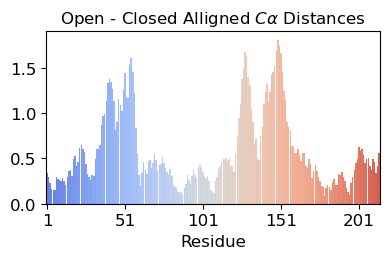

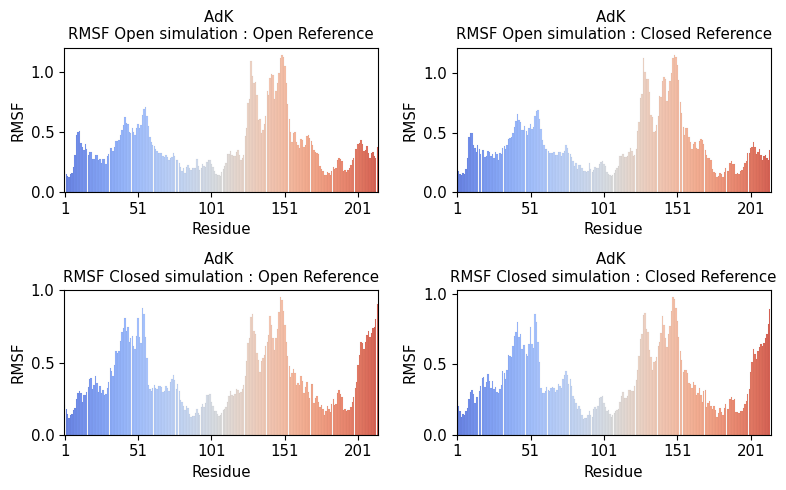

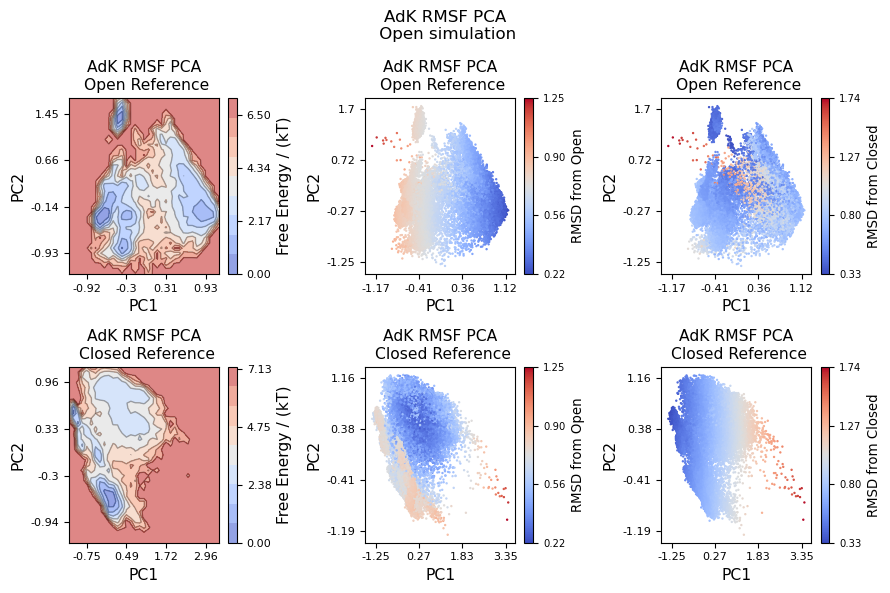

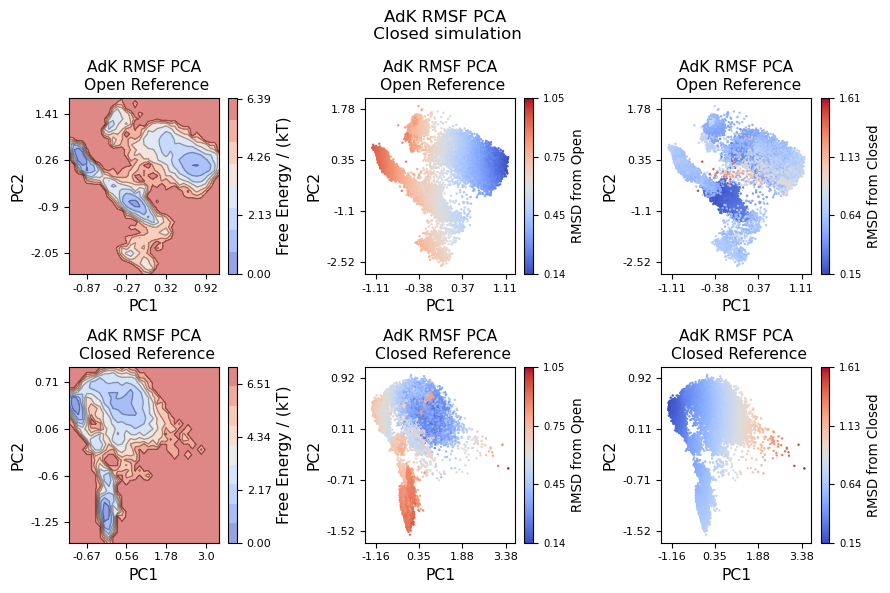

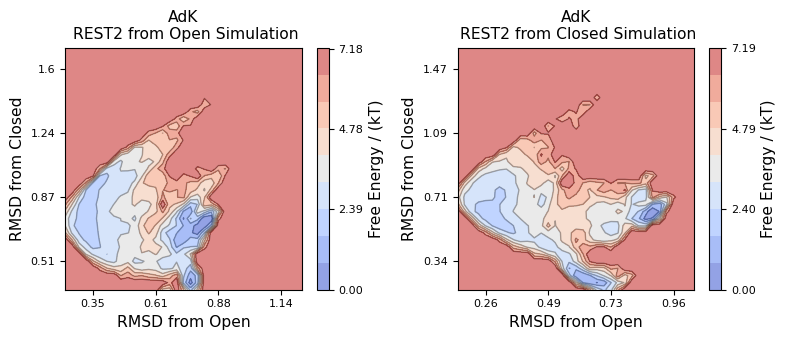

...

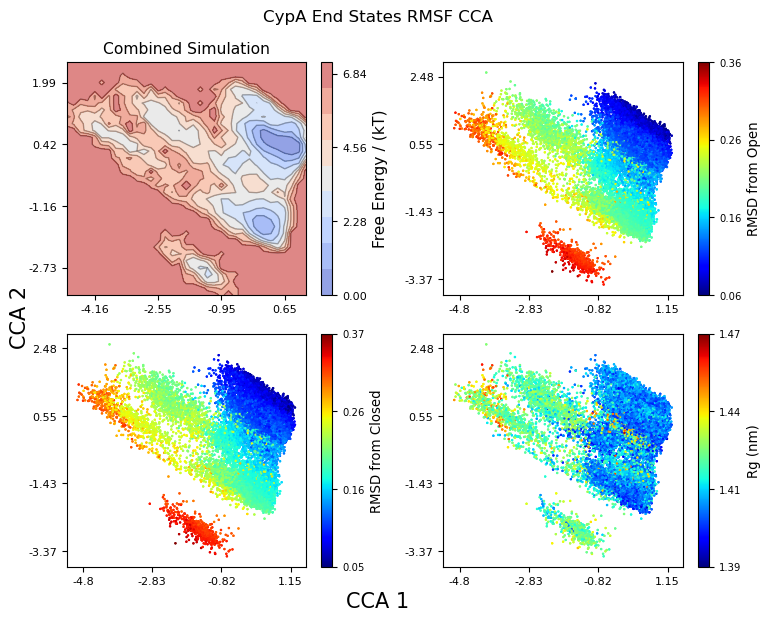

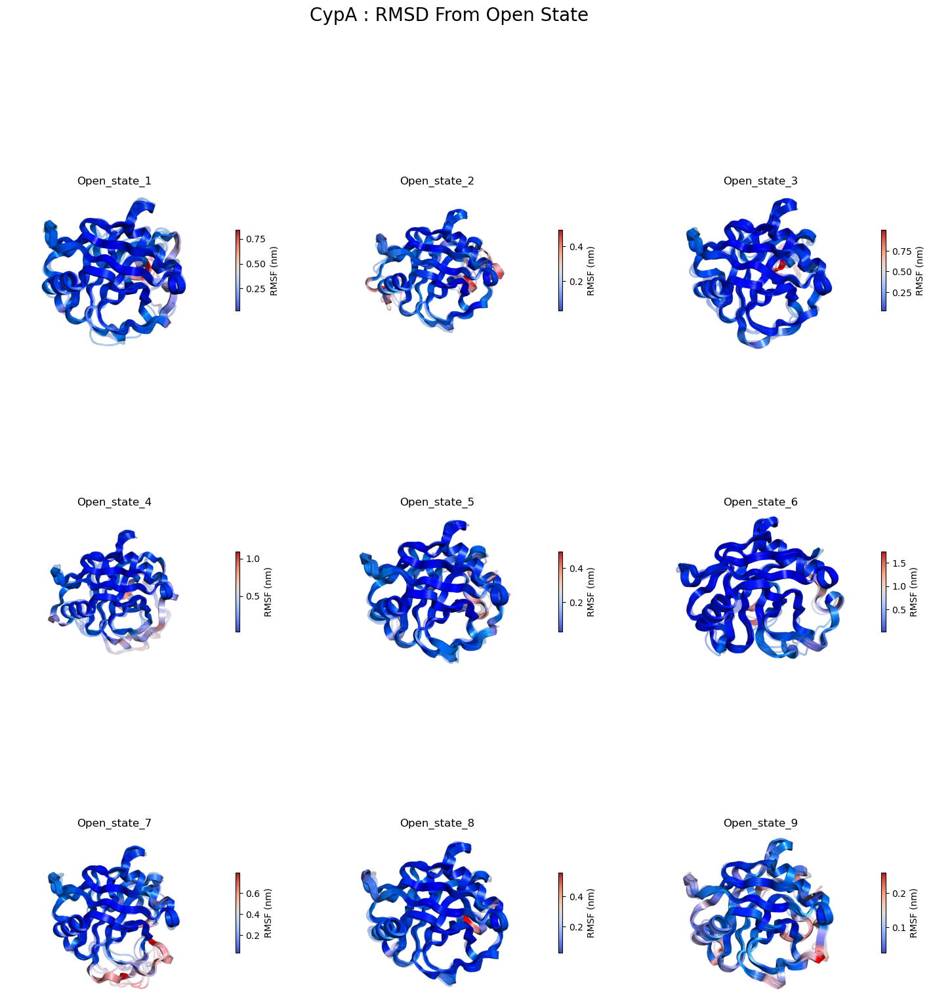

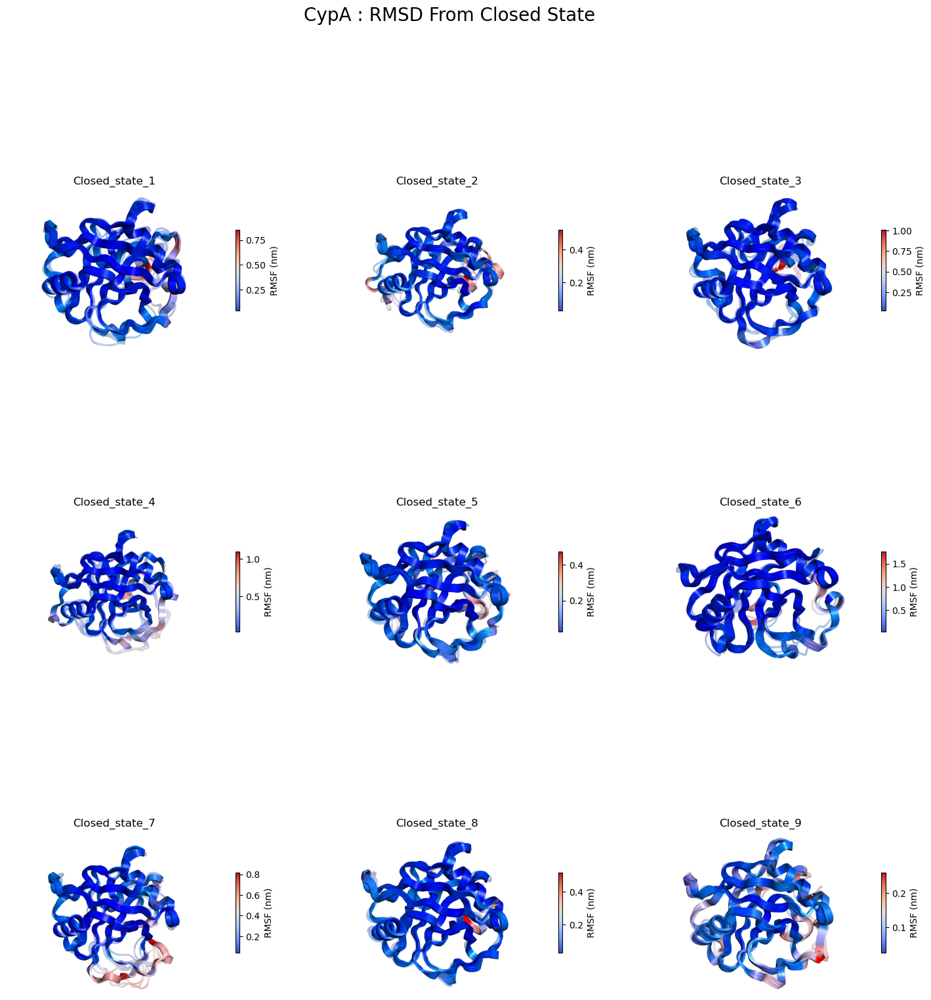

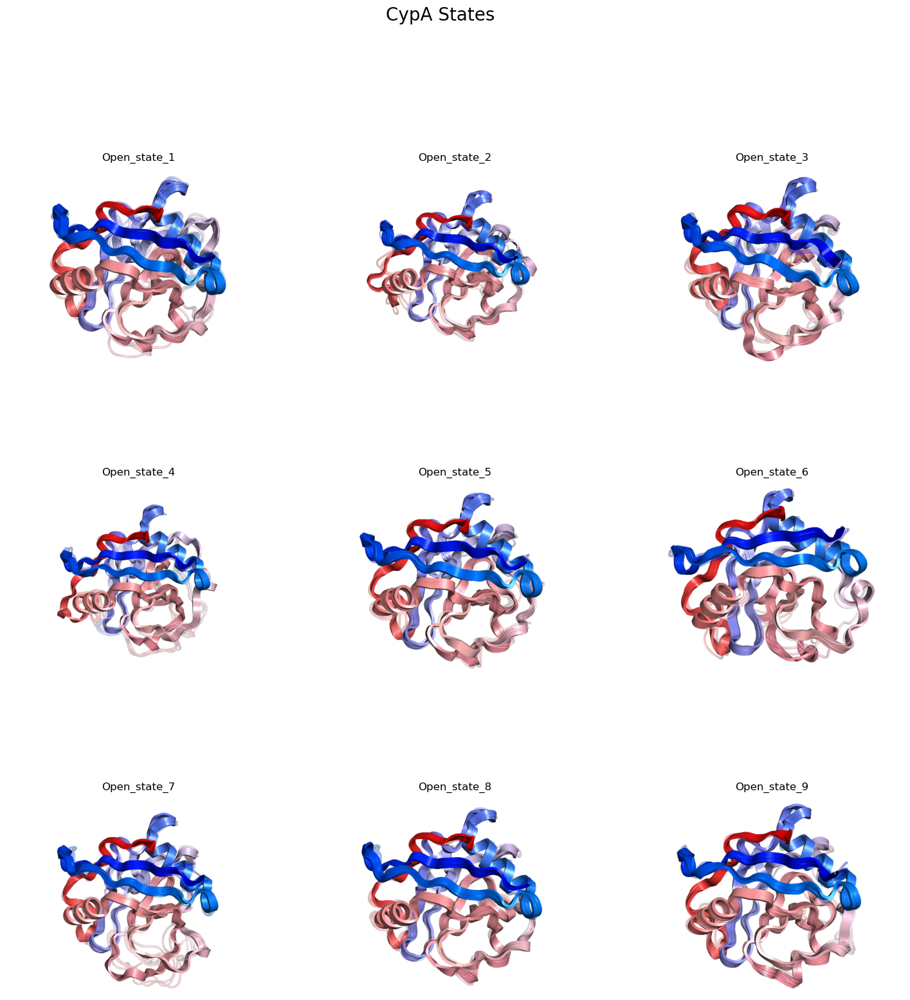

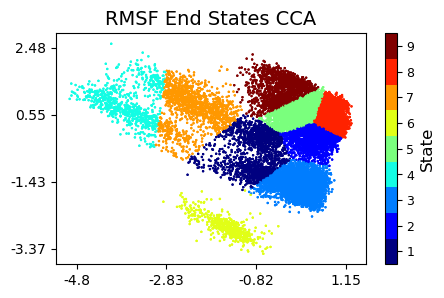

In [138]:
import warnings; warnings.simplefilter('ignore')
from package.visualize.visualize import palettes
from copy import deepcopy
alpha_lines=.3
alpha_contours=.6
n_contours = 8
bins=35
n_struc=10
all_pca_data = []
data = []
ccas = []

cat_pcas = []
from package.utils.utils import get_extrema
for path in paths:
    
    protein = rm_path(path)
    
    trjs = [load_traj(f"{path}/{i}",
                      exclude="_",
                      traj_keyword="sim.", pdb_keyword="top.",
                      traj_ext="xtc", top_ext="pdb",
                      selection="all")[0] for i in ("open", "closed")]
    
    ref_files = [lsdir(f"{path}/{i}", keyword="ref.", exclude="_")[0] for i in ("open", "closed")]
    refs = [traj_slice(md.load(file), "all") for file in ref_files]
    
    fig, ax = plt.subplots(1, 1, figsize=(4, 2.7))
    rmsf_AB = rsf(*refs)

    box_plot(rmsf_AB, xlabel="Residue", title=r"Open - Closed Alligned $C\alpha$ Distances",
             label_stride=50, font_scale=2, linewidth=0.02, alpha=.9,
             cmap="coolwarm", ax=ax)
    fig.tight_layout()
    
    rg = np.concatenate([md.compute_rg(traj_slice(i, "name CA")) for i in trjs])

    
    fig_rmsfs, axes_rmsfs = plt.subplots(2, 2, figsize=(8, 5))
    fig_pcas, axes_pcas = plt.subplots(2, 3, figsize=(9, 6))
    fig_pcas2, axes_pcas2 = plt.subplots(2, 3, figsize=(9, 6))
    fig_rmsds, axes_rmsds = plt.subplots(1, 2, figsize=(8, 3.5))
    #flucs_idx = []
    #fig.suptitle(r"$C\alpha$ RMSF")
    pcas, rmsfs, rmsds, features = [], [], [], []
    
    for trj, ref, label, ax_rmsf, ax_pca, ax_rmsd in zip(trjs,
                                                         refs,
                                                         ["Open", "Closed"],
                                                         axes_rmsfs,
                                                         [axes_pcas, axes_pcas2],
                                                         axes_rmsds.flat):
        
        rmsf = [md.rmsf(traj_slice(trj, "name CA"), traj_slice(r, "name CA")) for r in refs]
        
        rmsd = [md.rmsd(traj_slice(trj, "name CA"), traj_slice(r, "name CA")) for r in refs]
        
        feature = [rsf(trj, r) for r in refs]
        
        pc = [pca(feat,
                  dask=False,
                  n_comp=2,
                  shift=True,
                  scale_projection=True)[0]
             for feat in feature]
        
        
        # RMSF from references plots
        box_plot(rmsf[0], xlabel="Residue", ylabel="RMSF",
                 title=f"{protein} \nRMSF {label} simulation : Open Reference",
                 label_stride=50, font_scale=1.8, linewidth=0.02, alpha=.9,
                 ax=ax_rmsf[0], cmap="coolwarm")
        
        box_plot(rmsf[1], xlabel="Residue", ylabel="RMSF",
                 title=f"{protein} \nRMSF {label} simulation : Closed Reference",
                 label_stride=50, font_scale=1.8, linewidth=0.02, alpha=.9,
                 ax=ax_rmsf[1], cmap="coolwarm")
        
        
        # RMSDs 2D from both states
        fes2d(rmsd[0],
              rmsd[1],
              title=f"{protein}\n REST2 from {label} Simulation",
              xlabel="RMSD from Open",
              ylabel="RMSD from Closed",
              bins=bins,
              mask=False,
              contour_lines=True,
              n_contours=n_contours,
              alpha_contours=alpha_contours,
              alpha_lines=alpha_lines,
              ax=ax_rmsd,
              font_scale=.8,
              tick_decimals=2,
              cmap="coolwarm")
        
        
        # PCA 
        
        # PCA RMSF Open
        fes2d(100 * pc[0][:,:2],
              title=f"{protein} RMSF PCA\n Open Reference",
              xlabel="PC1",
              ylabel="PC2",
              bins=bins,
              mask=False,
              contour_lines=True,
              n_contours=n_contours,
              alpha_contours=alpha_contours,
              alpha_lines=alpha_lines,
              ax=ax_pca[0, 0],
              font_scale=.8,
              cmap="coolwarm")
        
        proj2d(100 * pc[0][:,:2],
               c=rmsd[0],
               title=f"{protein} RMSF PCA\n Open Reference",
               xlabel="PC1",
               ylabel="PC2",
               cbar_label="RMSD from Open",
               ax=ax_pca[0, 1],
               font_scale=.8,
               cmap="coolwarm")
        
        proj2d(100 * pc[0][:,:2],
               c=rmsd[1],
               title=f"{protein} RMSF PCA\n Open Reference",
               xlabel="PC1",
               ylabel="PC2",
               cbar_label="RMSD from Closed",
               ax=ax_pca[0, 2],
               font_scale=.8,
               cmap="coolwarm")
        
        # PCA RMSF closed
        
        fes2d(100 * pc[1][:,:2],
              title=f"{protein} RMSF PCA\n Closed Reference",
              xlabel="PC1",
              ylabel="PC2",
              bins=bins,
              mask=False,
              contour_lines=True,
              n_contours=n_contours,
              alpha_contours=alpha_contours,
              alpha_lines=alpha_lines,
              ax=ax_pca[1, 0],
              font_scale=.8,
              cmap="coolwarm")
        
        proj2d(100 * pc[1][:,:2],
               c=rmsd[0],
               title=f"{protein} RMSF PCA\n Closed Reference",
               xlabel="PC1",
               ylabel="PC2",
               cbar_label="RMSD from Open",
               ax=ax_pca[1, 1],
               font_scale=.8,
               cmap="coolwarm")
        
        proj2d(100 * pc[1][:,:2],
               c=rmsd[1],
               title=f"{protein} RMSF PCA\n Closed Reference",
               xlabel="PC1",
               ylabel="PC2",
               cbar_label="RMSD from Closed",
               ax=ax_pca[1, 2],
               font_scale=.8,
               cmap="coolwarm")
        
        
        
        
        rmsfs.append(rmsf)
        features.append(feature)
        pcas.append(pc)
        rmsds.append(rmsd)
        
    fig_pcas.suptitle(f"{protein} RMSF PCA\n Open simulation")
    fig_pcas2.suptitle(f"{protein} RMSF PCA\n Closed simulation")
    
        

    fig_rmsfs.tight_layout()
    fig_rmsds.tight_layout()
    fig_pcas.tight_layout()
    fig_pcas2.tight_layout()
    
    ##Combined PCA
    cat_features = np.concatenate([np.concatenate(features[0], 1), np.concatenate(features[1], 1)],0)
    
    
    pca_cat = pca(cat_features)[0]
    cat_pcas.append(np.copy(pca_cat))
    pca_cat = pca_cat[:, :2]
   
    rmsd_cat = [np.stack(rmsds[0]), np.concatenate([np.stack(i).T for i in rmsds]).T, np.stack(rmsds[1])]
    
    extent = [get_extrema(i) for i in pca_cat.T]
    
    
    
    
    fes2d(rmsd_cat[0].T,
      title=f"{protein}\n REST2 from Combined Simulation",
      xlabel="RMSD from Open",
      ylabel="RMSD from Closed",
      bins=bins,
      mask=False,
      contour_lines=True,
      n_contours=n_contours,
      alpha_contours=alpha_contours,
      alpha_lines=alpha_lines,
      font_scale=.8,
      tick_decimals=2,
      cmap="coolwarm")
    
    labels = ["Open", "Combined", "Closed"]
    samples = [pca_cat[:trjs[0].n_frames], pca_cat, pca_cat[trjs[0].n_frames:]]
    fig_cat, axes_cat = plt.subplots(3, 3, figsize=(10, 8), )
    fig_cat.suptitle(f"{protein} End States RMSF PCA")
    fig_cat.supylabel("PC 2", x=0.04, size=15)
    fig_cat.supxlabel("PC 1", y = 0.04, size=15)
    
    for i, (sample, label, sd, ax) in enumerate(zip(samples, labels, rmsd_cat, axes_cat.T)):
        
        ax=ax.flat
        fes2d(100 * sample,
          title=f"{label} Simulation",
#           xlabel="PC1",
#           ylabel="PC2",
          bins=bins,
          mask=False,
          contour_lines=True,
          n_contours=n_contours,
          alpha_contours=alpha_contours,
          alpha_lines=alpha_lines,
          ax=ax[0],
          font_scale=.8,
          cbar=False if i!=2 else True,
          cmap="coolwarm",
      )
        
        proj2d(100 * sample,
        c=sd[0],
        cbar=False if i!=2 else True,
#         xlabel="PC1",
#         ylabel="PC2",
        cbar_label="RMSD from Open",
        ax=ax[1],
        font_scale=.8,
        cmap="coolwarm")
        
        proj2d(100 * sample,
        c=sd[1],
#         xlabel="PC1",
#         ylabel="PC2",
        cbar_label="RMSD from Closed",
        cbar=False if i!=2 else True,
        ax=ax[2],
        font_scale=.8,
        cmap="coolwarm")
    
    
        
        
        
    
    
    
    data.append(dict(features=features,
                rmsfs=rmsfs,
                rmsds=rmsds,
                pcas=pcas)
               )
    
    
    
    
    ## CCA
    fig_cca, axes_ = plt.subplots(2,2, figsize=(8,6.4, ), )
    ax_ = axes_.flat
    fig_cca.suptitle(f"{protein} End States RMSF CCA")
    fig_cca.supylabel("CCA 2", x=0.04, size=15)
    fig_cca.supxlabel("CCA 1", y = 0.04, size=15)

    
    x, y = np.array_split(cat_features, 2, axis=1)
    cca = CCA(x, y).fit_transform(dim=3)
    ccas.append(np.copy(cca))
    cca[0] = cca[0][:,:2]
    
    extent = [get_extrema(i) for i in cca[0].T]
    
    fes2d(cca[0],
      title=f"Combined Simulation",
#           xlabel="PC1",
#           ylabel="PC2",
      bins=bins,
      mask=False,
      contour_lines=True,
      n_contours=n_contours,
      alpha_contours=alpha_contours,
      alpha_lines=alpha_lines,
      ax=ax_[0],
      font_scale=.8,
      cmap="coolwarm",
  )

    proj2d(cca[0],
    c=rmsd_cat[1][0],

#         xlabel="PC1",
#         ylabel="PC2",
    cbar_label="RMSD from Open",
    ax=ax_[1],
    font_scale=.8,
    cmap="jet")

    proj2d(cca[0],
    c=rmsd_cat[1][1],
#         xlabel="PC1",
#         ylabel="PC2",
    cbar_label="RMSD from Closed",
    ax=ax_[2],
    font_scale=.8,
    cmap="jet")
    
    proj2d(cca[0],
    c=rg,
#         xlabel="PC1",
#         ylabel="PC2",
    cbar_label="Rg (nm)",
    ax=ax_[3],
    font_scale=.8,
    cmap="jet")

    fig_cca.tight_layout()
    
    
    # clustering
    
    traj = md.join([traj_slice(i, "name CA") for i in trjs])
    traj = traj_slice(traj, "name CA").superpose(traj_slice(refs[1], "name CA"))
    dtraj, frames = Kmeans(cca[0], 9, 2)
    
    for label, beta, ref in zip(["Open", "Closed"], (x, y), refs):
        fig, axes = plt.subplots(3, 3, figsize=(18, 18))
        fig.suptitle(f"{protein} : RMSD From {label} State", size=20, y = .99)
        for i, (ax, frame) in enumerate(zip(axes.flat, frames)):
            
            
            
            visualize_clustering(traj, frame, path, f"{label}_state_{i+1}", features=beta, ax=ax)
            
    
    
    for label, beta, ref in zip(["Open"], (x, y), refs):
        fig, axes = plt.subplots(3, 3, figsize=(18, 18))
        fig.suptitle(f"{protein} States", size=20, y = .99)
        for i, (ax, frame) in enumerate(zip(axes.flat, frames)):
            
            
            
            visualize_clustering(traj, frame, path, f"{label}_state_{i+1}", features=None, ax=ax)
        
    
    proj2d(cca[0], c=dtraj, state_map=True, title="RMSF End States CCA")

    
    
    
    
    
    
#     ## Writhe
#     writhe_data = np.split(np.concatenate([np.concatenate([writhe_fluctuation(j, i, 3) for i in refs], 1) for j in trjs]), 2, 1)
#     cca = CCA(*writhe_data).fit_transform(dim=2)
    
    
    
#     fig_wr, axes_wr = plt.subplots(2,2, figsize=(8,6.4, ), )
#     ax_ = axes_wr.flat
#     fig_wr.suptitle(f"{protein} End States Writhe CCA")
#     fig_wr.supylabel("CCA 2", x=0.04, size=15)
#     fig_wr.supxlabel("CCA 1", y = 0.04, size=15)
    
#     extent = [get_extrema(i) for i in cca[0].T]
    
#     fes2d(cca[0],
#       title=f"Combined Simulation",
# #           xlabel="PC1",
# #           ylabel="PC2",
#       bins=bins,
#       mask=False,
#       contour_lines=True,
#       n_contours=n_contours,
#       alpha_contours=alpha_contours,
#       alpha_lines=alpha_lines,
#       ax=ax_[0],
#       font_scale=.8,
#       cmap="coolwarm",
#   )

#     proj2d(cca[0],
#     c=rmsd_cat[1][0],

# #         xlabel="PC1",
# #         ylabel="PC2",
#     cbar_label="RMSD from Open",
#     ax=ax_[1],
#     font_scale=.8,
#     cmap="coolwarm")

#     proj2d(cca[0],
#     c=rmsd_cat[1][1],
# #         xlabel="PC1",
# #         ylabel="PC2",
#     cbar_label="RMSD from Closed",
#     ax=ax_[2],
#     font_scale=.8,
#     cmap="coolwarm")
    
#     proj2d(cca[0],
#     c=rg,
# #         xlabel="PC1",
# #         ylabel="PC2",
#     cbar_label="Rg (nm)",
#     ax=ax_[3],
#     font_scale=.8,
#     cmap="coolwarm")

#     fig_wr.tight_layout()



    

        
        
#         idx=features[0].sum(1).argsort()[:n_struc]
#         temp = deepcopy(trj)
#         temp.xyz[0] = ref.xyz
#         visualize.plot_structure(visualize.make_structures(temp,
#                                                            indices=np.insert(idx, 0, 0),
#                                                            dir=f"{path}/images",
#                                                            ensemble=True,
#                                                            overwrite=True,
#                                                            transparency=.6,
#                                                            draw_style="cartoon",
#                                                            name=f"{label}_State",
#                                                            palette = palettes['coolwarm'],
#                                                            save_state=True,
#                                                            cartoon_loop_radius=.25,
#                                                            ref=ref_files[0],
#                                                            beta_values=None),
#                                  legend=False,
#                                  title=f"{label} State",
#                                  ax=ax,
#                                  #cbar=True,cmap="coolwarm",
#                                  #vmin=rmsf.min(),
#                                  #vmax=rmsf.max(),
#                                  #cbar_label="RMSF (nm)",
#                             )
#         fig.tight_layout()

        #flucs_idx.append(np.where(rmsf > np.percentile(rmsf, [75, 100])[0])[0])


#     fig.tight_layout()
    
    
#     fig, axes = plt.subplots(1, 2, figsize=(15, 8))
    
#     fig.suptitle("Reference Structures", y = .8)
# #     for ref, traj, feature, label, ax in zip(refs, trjs, features, ["Open", "Closed"], axes.flat):
# #         idx=data["feats"].sum(1).argsort()[:n_struc]
# #         temp.xyz[0] = ref.xyz
        
# #         visualize.plot_structure(visualize.make_structures(temp,
# #                                                            indices=np.concateante([0, idx]),
# #                                                            dir=f"{path}/images",
# #                                                            ensemble=True,
# #                                                            overwrite=True,
# #                                                            transparency=.6,
# #                                                            draw_style="cartoon",
# #                                                            name=f"{label}_State",
# #                                                            palette = palettes['coolwarm'],
# #                                                            save_state=True,
# #                                                            cartoon_loop_radius=.25,
# #                                                            ref=ref_files[0],
# #                                                            beta_values=None),
# #                                  legend=False,
# #                                  title=f"{label} State",
# #                                  ax=ax,
# #                                  #cbar=True,cmap="coolwarm",
# #                                  #vmin=rmsf.min(),
# #                                  #vmax=rmsf.max(),
# #                                  #cbar_label="RMSF (nm)",
# #                             )
# #     fig.tight_layout()
    
# #     fig, axes = plt.subplots(1, 2, figsize=(15, 8))
# #     fig.suptitle("Reference Structures", y = .8)
# #     for ref, label, rmsf, ax in zip(refs, ["Open", "Closed"],
# #                                     data["rmsfs"],
# #                                     axes.flat):
# #         visualize.plot_structure(visualize.make_structures(ref,
# #                                                            indices=0,
# #                                                            dir=f"{path}/images",
# #                                                            ensemble=True,
# #                                                            overwrite=True,
# #                                                            transparency=.6,
# #                                                            draw_style="cartoon",
# #                                                            name=f"{label}_State_betas",
# #                                                            palette = palettes['coolwarm'],
# #                                                            save_state=True,
# #                                                            cartoon_loop_radius=.25,
# #                                                            ref=ref_files[0],
# #                                                            beta_values=rmsf[0]),
# #                                  legend=False,
# #                                  title=f"{label} State",
# #                                  ax=ax,
# #                                  cbar=True,cmap="coolwarm",
# #                                  vmin=rmsf.min(),
# #                                  vmax=rmsf.max(),
# #                                  cbar_label="RMSF (nm)",
# #                             )
        

    
    

    
    
    

In [135]:
cca[0].shape

(51179, 2)

(26130,)
(51179, 2)


ValueError: 'c' argument has 26130 elements, which is inconsistent with 'x' and 'y' with size 25590.

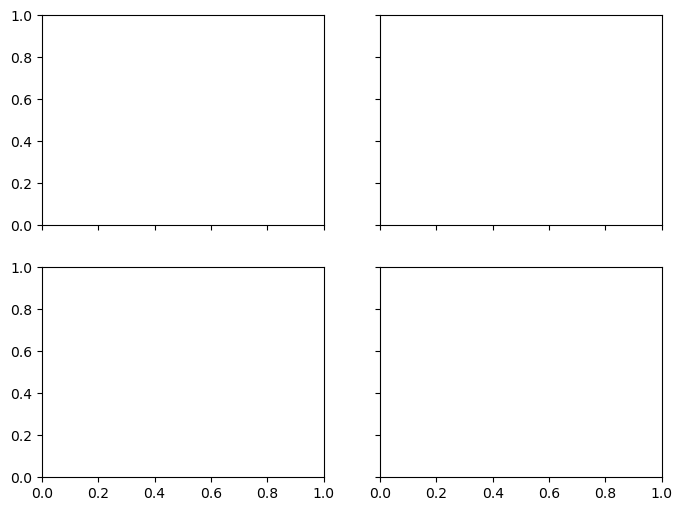

In [136]:
fig, axes = plt.subplots(2, 2, figsize=(8, 6), sharey=True, sharex=True)
obs = load_array_dir("/home/t/kern/rest/CypA")
for angle, name, ax in zip(obs.values(), obs.keys(), axes.flat):
    print(angle.shape)
    print(cca[0].shape)
    proj2d(np.array_split(cca[:], 2)[0], c=angle, cbar_label=name, ax=ax, cmap="hsv", title="RMFD CCA")

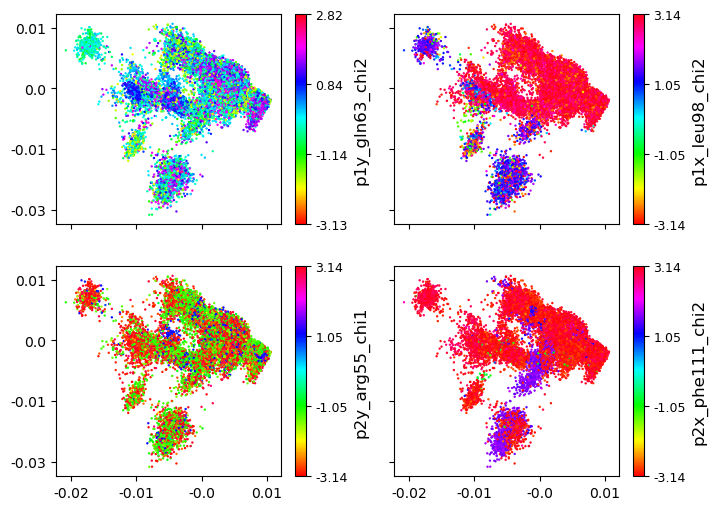

In [24]:
fig, axes = plt.subplots(2, 2, figsize=(8, 6), sharey=True, sharex=True)
proj = data[-1]["pcas"][0][0][:,:2] * np.array([1, -1])
obs = load_array_dir("/home/t/kern/rest/CypA")
for angle, name, ax in zip(obs.values(), obs.keys(), axes.flat):
    proj2d(proj, c=angle, cbar_label=name, ax=ax, cmap="hsv")
    


In [55]:
x, y = features[0][0], features[0][1]

In [56]:
pro = pca(np.concatenate([x, y], 1))[0][:,:2]

In [62]:
total = np.concatenate([np.concatenate(features[0], 1), np.concatenate(features[1], 1)],0)

In [66]:
proj = pca(total)[0][:,:2]

In [69]:
rmsd_tot = np.stack([np.concatenate([rmsds[0][0], rmsds[1][0]]),np.concatenate([rmsds[0][1], rmsds[1][1]])])

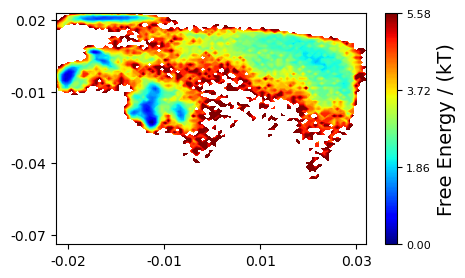

In [70]:
fes2d(proj, bins=100)

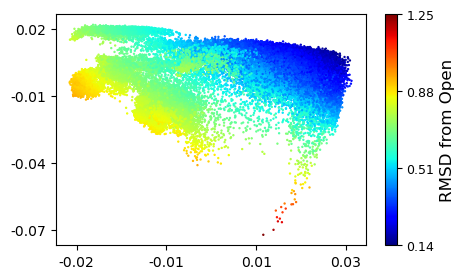

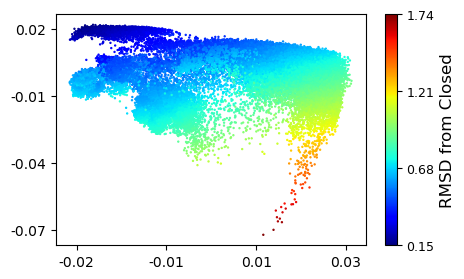

In [74]:
proj2d(proj, c = rmsd_tot[0], cbar_label="RMSD from Open")
proj2d(proj, c = rmsd_tot[1], cbar_label="RMSD from Closed")


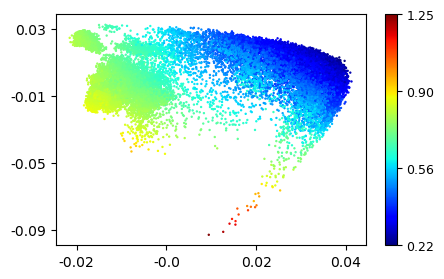

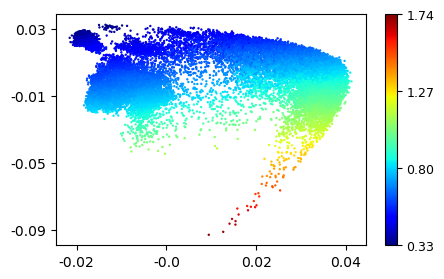

In [58]:
proj2d(pro, c=rmsds[0][0])
proj2d(pro, c=rmsds[0][1])

In [3]:
import warnings; warnings.simplefilter('ignore')
for path in paths:    
    
    trjs = [load_traj(f"{path}/{i}", traj_ext="xtc", top_ext="gro", selection="protein")[0] for i in ("open", "closed")]
    
    refs = [traj_slice(md.load(lsdir(f"{path}/{i}", keyword="pdb")[0]), "protein") for i in ("open", "closed")]
    
    pcs = [pca(Writhe(traj_slice(traj, "name CA").xyz).compute_writhe(1)["writhe_features"], dask=True, n_comp=2)[0]
           for traj in trjs]
    rmsds = [[md.rmsd(trj, ref) for ref in refs] for trj in trjs]
    
    fig, axes = plt.subplots(1, 2, figsize=(8, 3))
    fig2, axes2 = plt.subplots(1, 2, figsize=(8, 3))
    for rmsd, label, ax, ax2, pc  in zip(rmsds,
                                 ["Open", "Closed"],
                                 axes.flat,
                                 axes2.flat,
                                 pcs):
        fes2d(rmsd[0],
              rmsd[1],
              title=f"{label} Simulation",
              xlabel="RMSD from Open",
              ylabel="RMSD from Closed",
              bins=50,
              ax=ax)
        
        fes2d(pc[0],
              pc[1],
              title=f"{label} Simulation",
              xlabel="PC 1",
              ylabel="PC 2",
              bins=50,
              ax=ax2)
        
               
    fig.tight_layout()
    labels = list(chain(*[[f"{j} from {i}" for i in ("Open", "Closed")] for j in ["Open", "Closed"]]))
    titles = ["", "Open", "", "Closed"]
    fig, axes = plt.subplots(1, 2, figsize=(8, 2))
    ax = axes.flat
    
    for rmsd, label, title, axis in zip(list(chain(*rmsds)),
                                       labels,
                                       titles,
                                       [ax[0], ax[0], ax[1], ax[1]],
                                      ):
        axis.hist(rmsd, bins=50, histtype="step", label = label, lw = 1, density=True)
        axis.set_title(f"{title} Simulation")
        axis.legend()
    ax[1].legend(bbox_to_anchor=[1,1])
    
    


Loading Trajectory File : /home/t/kern/rest/AdK/open/whole.xtc with top file : /home/t/kern/rest/AdK/open/non-water.gro
Loading Trajectory File : /home/t/kern/rest/AdK/closed/whole.xtc with top file : /home/t/kern/rest/AdK/closed/non-water.gro


2024-05-21 13:56:18,854	INFO worker.py:1636 -- Started a local Ray instance.


ValueError: not enough values to unpack (expected 2, got 1)